In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.fft as fft   
from scipy.io.wavfile import write
import IPython
from scipy import signal


In [2]:
df = pd.read_hdf('data.h5') #lecture du fichier et création de Dataframe 
df = df.iloc[2:,:]

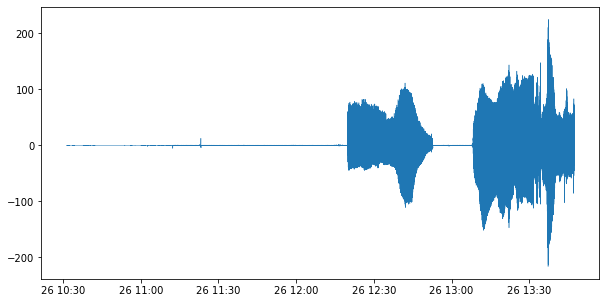

In [3]:
plt.figure(figsize=(10,5)) # affichage des résultats , le delta lux
fig=plt.plot(df.date,df.delta_lux,linewidth=0.5)
plt.show()

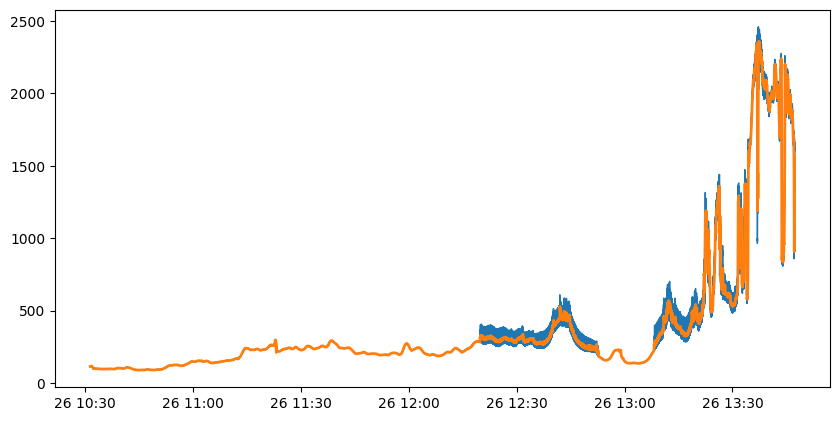

In [4]:
plt.figure(figsize=(10,5),dpi=100)
fig=plt.plot(df.date,df.lux,linewidth=1)
fig=plt.plot(df.date,df.lux.rolling(50).mean(),linewidth=0.5)
plt.show()

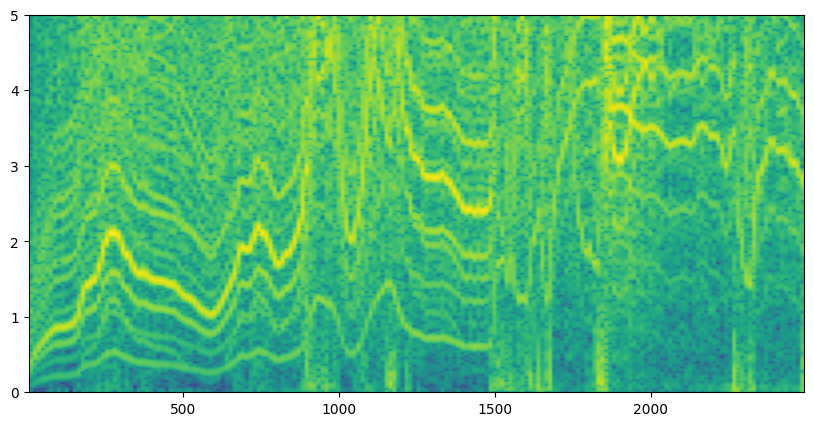

In [13]:
balanced_signal = df.delta_lux.tail(25000)
plt.figure(figsize=(10,5),dpi=100)
plt.set_cmap('viridis')
spectrum= plt.specgram(balanced_signal,Fs=10,NFFT=256,pad_to=4096,detrend='mean',mode='magnitude')
plt.show()

In [11]:
samplerate = 44100
resampled= signal.resample(balanced_signal.astype(np.float32)*(1/max(balanced_signal)*1),len(balanced_signal)*50)
write("example.wav", samplerate, resampled)

In [12]:
IPython.display.Audio("example.wav")